In [1]:
# Imports 
import numpy as np
import matplotlib.pyplot as plt

# Örnek 1

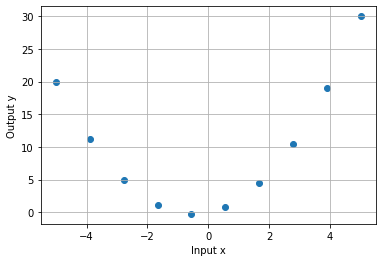

In [2]:
# y = f(x) için x değerlerini tanımlayalım
x = np.linspace(-5,5,10)

# y = x^2 + x 
a = 1
y = a * x**2 + x

# Belirli noktalarımızı çizdirelim
plt.scatter(x,y)
plt.grid(True)
plt.xlabel("Input x")
plt.ylabel("Output y")
plt.show()

In [3]:
# Hata Fonksiyonumuz
def mse(x, x_):
    return np.mean((x-x_)**2)

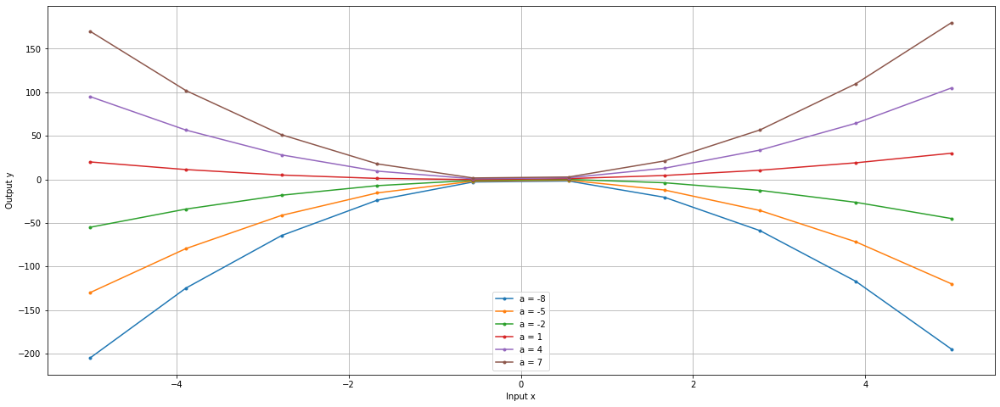

In [4]:
# Tüm a değeleri için hata

l = []

olasi_a_lar = np.arange(-8,8,3)

plt.figure(figsize = (20,8))

for a in olasi_a_lar:
    y_ = a * x**2 + x
    plt.plot(x,y_,".-", label= f"a = {a}")
    l.append(mse(y,y_))
    
plt.xlabel("Input x")
plt.ylabel("Output y")
plt.legend()
plt.grid(True)
plt.show()

In [5]:
# Tüm a değerleri için loss değerlerimizi yazdıralım
for l_, a_ in zip(l,olasi_a_lar):
    print(f"a={a_} \t-->\t Hata={l_}")

a=-8 	-->	 Hata=14921.296296296297
a=-5 	-->	 Hata=6631.687242798354
a=-2 	-->	 Hata=1657.9218106995886
a=1 	-->	 Hata=0.0
a=4 	-->	 Hata=1657.9218106995886
a=7 	-->	 Hata=6631.687242798354


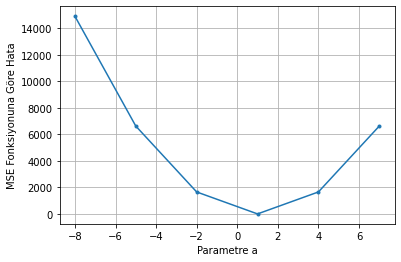

In [6]:
# Tüm a değerleri için loss değerlerimizi çizdirelim
plt.plot(olasi_a_lar , l , ".-")
plt.xlabel("Parametre a")
plt.ylabel("MSE Fonksiyonuna Göre Hata")
plt.grid(True)

plt.show()

# Örnek 2

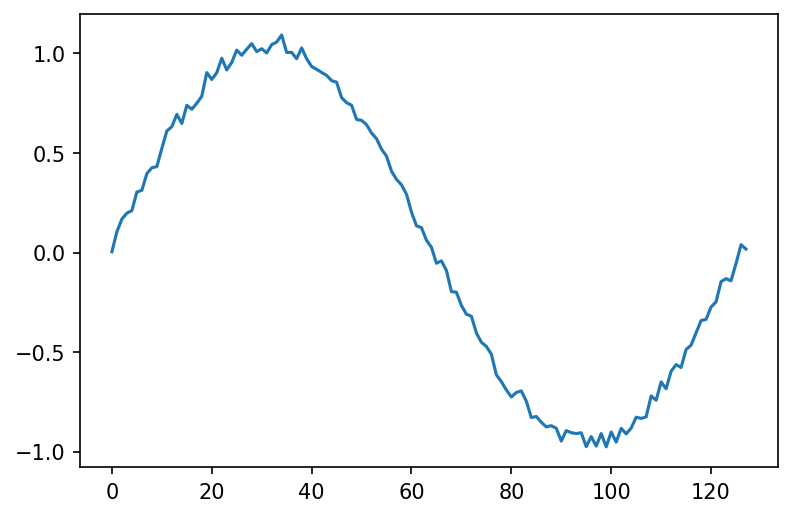

In [33]:
# Bir tane sinyalimiz olsun
SINYAL_UZUNLUGU = 128

t = np.linspace(0, 2 * np.pi, SINYAL_UZUNLUGU)

sinyal = np.sin(t) + np.random.random((SINYAL_UZUNLUGU,)) * 0.1

plt.plot (sinyal)

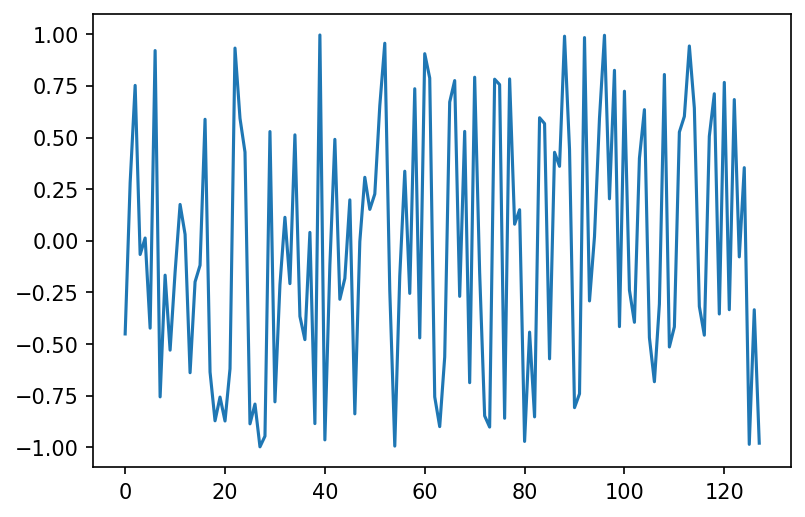

In [34]:
# bir de rastgele gürültümüz olsun

gurultu = np.random.random((SINYAL_UZUNLUGU,)) * 2 - 1

plt.plot(gurultu)

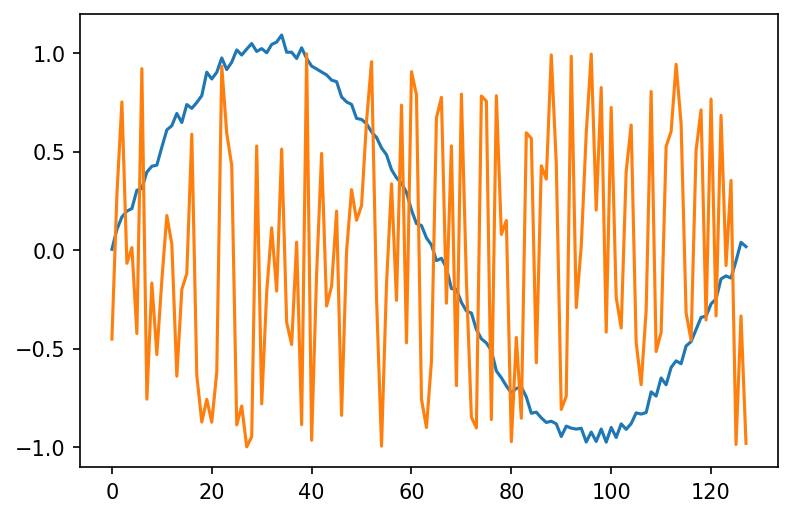

In [35]:
# Beraber Görelim
plt.plot(sinyal)
plt.plot(gurultu)

In [36]:
# Torch kullanalım...
import torch

In [37]:
# Verilerimizi önce torch tensor'une dönüştürelim.
hedef_tensor = torch.from_numpy(sinyal)
baslangic_tensor = torch.from_numpy(gurultu)

In [38]:
# Değişecek sinyalimizi belirtelim
baslangic_variable = torch.autograd.Variable(baslangic_tensor, requires_grad=True)

In [39]:
# Hedef değişkenimizi belirtelim ama aslında o bir değişken değil ...
hedef_variable = torch.autograd.Variable(hedef_tensor, requires_grad=False)

In [40]:
# Eğitim parametremizi belirtelim
# lr_ = 0.1
# lr_ = 0.01
lr_ = 0.5

In [41]:
# Optimizer tanımlayalım
optimizer = torch.optim.Adam([baslangic_variable], lr = lr_)

In [42]:
# Hata fonksiyonumuzu da torch'tan alalım
loss_fn  = torch.nn.MSELoss()

In [43]:
# Görselleştirme kütüphanemiz
import matplotlib.animation

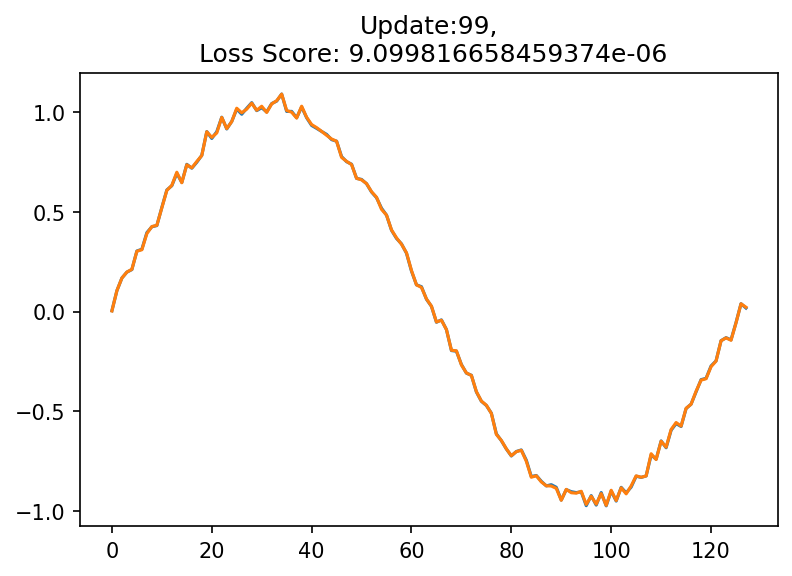

In [44]:
# Burası önemli değil
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots()


# Burası çok önemli
def animate(update_no):
    
    # Optimizer sıfırlama, her eğitim adımında yapılmalı
    optimizer.zero_grad()

    # Hata Hesaplansın
    loss = loss_fn(hedef_variable, baslangic_variable)

    # "Hatayı nasıl küçültebiliz" sorusunun cevabını öğrenelim -> Türev
    loss.backward()

    # Optimizer'ın değiştirebileceği değişkenleri, üzerlerindeki türevleri kullanarak güncelleyelim
    optimizer.step()

    # Görselleştirme
    plt.cla()
    plt.plot(hedef_variable.detach().numpy())
    plt.plot(baslangic_variable.detach().numpy())
    plt.title(f"Update:{update_no},\n Loss Score: {loss}")
    
# Yukarıdaki fonksiyon frames sayısı kadar dönsün, sonra animasyon üret
matplotlib.animation.FuncAnimation(fig, animate, frames=100)

# Örnek 3

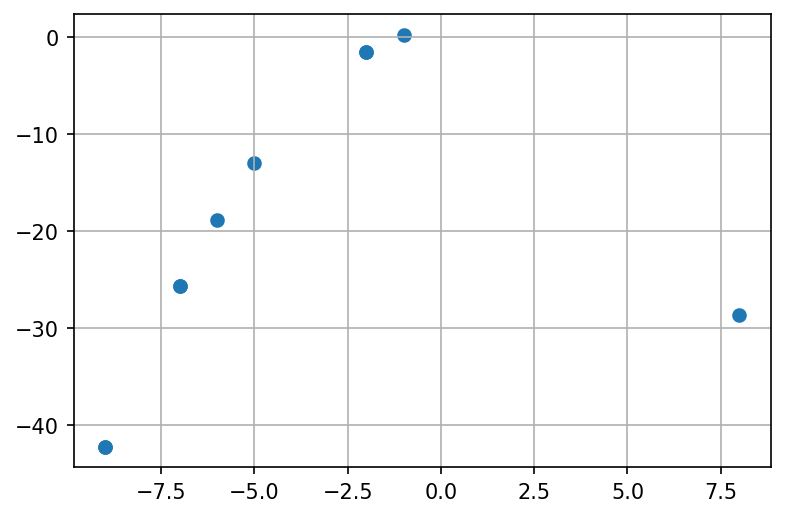

In [45]:
np.random.seed(99)

x = np.random.randint(-10,10,size=(10,))

a = - 0.5
b = + 0.3
c = + 1.0

y = a * x**2 + b * x + c

plt.scatter(x,y)
plt.grid(True)

In [46]:
x_variable = torch.autograd.Variable(torch.from_numpy(x).float(), requires_grad=False)
y_variable = torch.autograd.Variable(torch.from_numpy(y).float(), requires_grad=False)

torch.manual_seed(99)

a_ = torch.rand((1,))
b_ = torch.rand((1,))
c_ = torch.rand((1,))

a_variable = torch.autograd.Variable(a_, requires_grad=True)
b_variable = torch.autograd.Variable(b_, requires_grad=True)
c_variable = torch.autograd.Variable(c_, requires_grad=True)

In [47]:
optimizer = torch.optim.Adam([a_variable,b_variable,c_variable], lr=0.1)

In [48]:
loss_fn  = torch.nn.MSELoss()

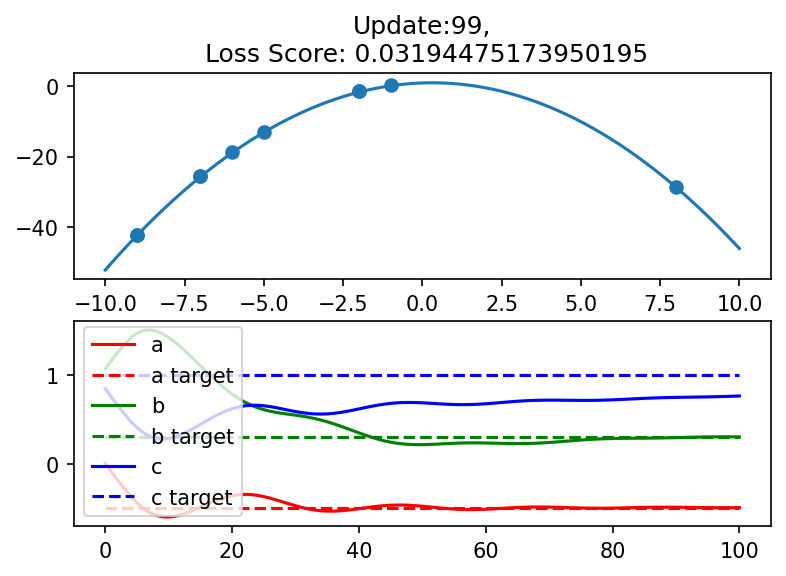

In [49]:
x_ = np.linspace(-10,10,1000)

num_frames = 100

a_hepsi = []
b_hepsi = []
c_hepsi = []

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig, ax = plt.subplots(2)

def animate(update_no):
    
    optimizer.zero_grad()
    
    y_hat_variable = a_variable*x_variable**2 + b_variable*x_variable + c_variable

    loss = loss_fn(y_variable, y_hat_variable)
    
    loss.backward()
 
    optimizer.step()
    
    ax[0].cla()
    ax[0].scatter(x,y)

    y_ = a_variable.detach().numpy()*x_**2 + b_variable.detach().numpy()*x_ + c_variable.detach().numpy()
    
    ax[0].plot(x_, y_)
    ax[0].set_title(f"Update:{update_no},\n Loss Score: {loss}")
    
    a_hepsi.append(a_variable.detach().numpy().copy())
    b_hepsi.append(b_variable.detach().numpy().copy())
    c_hepsi.append(c_variable.detach().numpy().copy())
    
    ax[1].cla()
    ax[1].plot(a_hepsi, "r-", label = "a")
    ax[1].plot([a]*len(a_hepsi), "r--", label = "a target")
    
    ax[1].plot(b_hepsi, "g-", label = "b")
    ax[1].plot([b]*len(b_hepsi), "g--", label = "b target")
    
    ax[1].plot(c_hepsi, "b-", label = "c")
    ax[1].plot([c]*len(c_hepsi), "b--", label = "c target")
    ax[1].legend()
    
matplotlib.animation.FuncAnimation(fig, animate, frames=num_frames)

In [50]:
print(f"{a_variable=}")
print(f"{b_variable=}")
print(f"{c_variable=}")

a_variable=tensor([-0.4976], requires_grad=True)
b_variable=tensor([0.3026], requires_grad=True)
c_variable=tensor([0.7648], requires_grad=True)


In [51]:
print(f"{a=}")
print(f"{b=}")
print(f"{c=}")

a=-0.5
b=0.3
c=1.0
